In [56]:
run functions_final.ipynb

In [6]:
cleaned_data = pd.read_csv('transactions_clean.csv')

timestamp_datetimes = []
for i in range(0,len(cleaned_data['timestamp'])):
    timestamp_string = cleaned_data['timestamp'][i]
    timestamp_datetimes.append(datetime.strptime(timestamp_string, '%Y-%m-%d %H:%M:%S'))

cleaned_data['timestamp'] = timestamp_datetimes
cleaned_data = cleaned_data.set_index('timestamp')

In [7]:
sarima_hp_weekly = {
    "p": [0,1,2],
    "d": [0,1],
    "q": [0,1,2],
    "P": [0,1,2],
    "D": [0,1],
    "Q": [0,1,2],
    "m": [4]
}

In [8]:
import warnings
warnings.filterwarnings("ignore")

(02000) Cabecera Autopista Norte
(02001) Centro Comercial Santa Fe
(02101) Toberín
(02102) Calle 161
(02103) Mazurén
(02104) Calle 146
(02105) Calle 142
(02200) Alcalá
(02201) Prado
(02202) Calle 127
(02204) Pepe Sierra
(02205) Calle 106
(02300) Calle 100
(02302) Virrey
(02303) Calle 85
(02304) Heroes
(02502) Terminal
(03000) Portal Suba
(03001) LA CAMPIÑA
(03002) SUBA - TV- 91
(03003) 21 ANGELES
(03004) GRATAMIRA
(03005) SUBA - AV. BOYACA
(03006) NIZA - CALLE 127
(03007) HUMEDAL CORDOBA
(03009) Av. Suba- Calle 116
(03010) PUENTE LARGO
(03011) SUBA - CALLE 100
(03012) SUBA - CALLE 95
(03013) RIO NEGRO
(03014) SAN MARTIN
(04000) Cabecera Calle 80
(04001) Quirigua
(04002) Carrera 90
(04003) Avenida Ciudad de Cali
(04100) Carrera 77
(04101) Minuto de Dios
(04102) Avenida Boyaca
(04103) Las Ferias
(04104) Avenida 68
(04105) Carrera 53
(04106) Carrera 47
(04107) Escuela Militar
(04108) El Polo
(05000) Portal Américas
(05001) Patio Bonito
(05002) Tintal
(05005) Transversal 86
(05100) Bandera

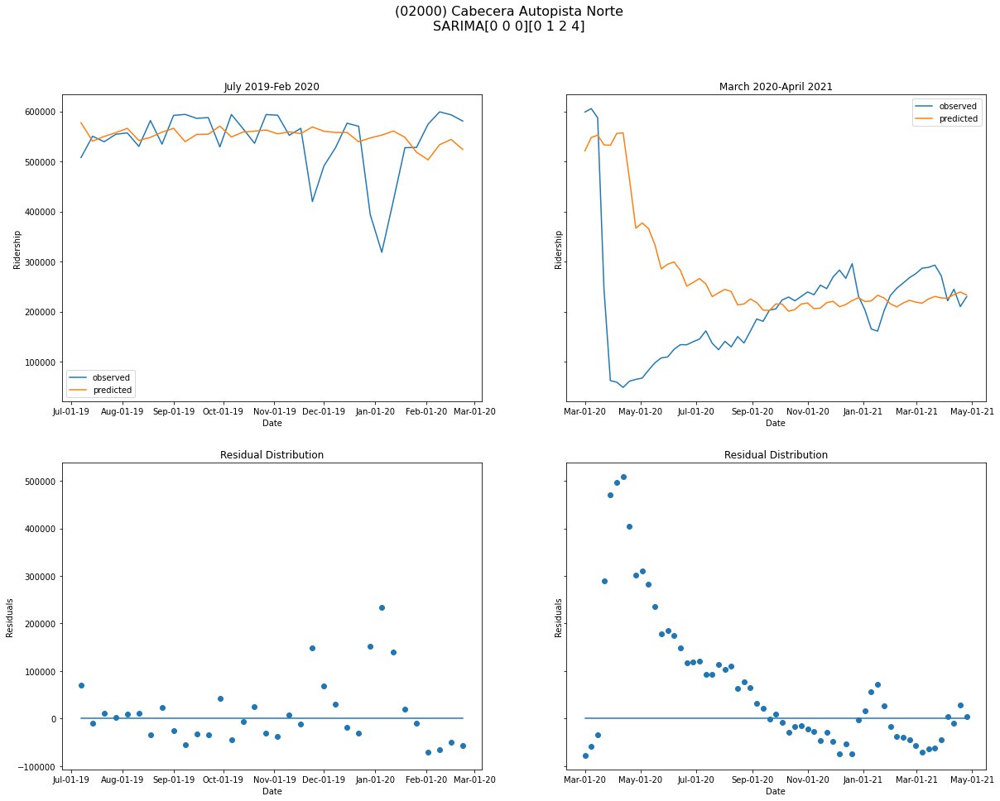

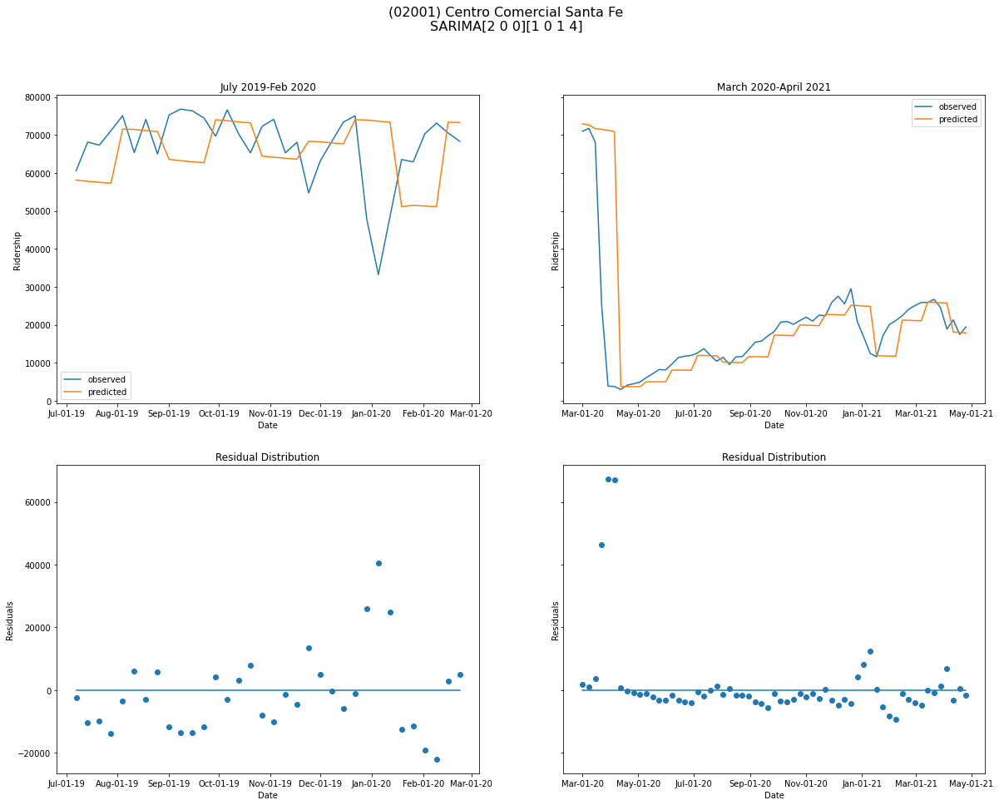

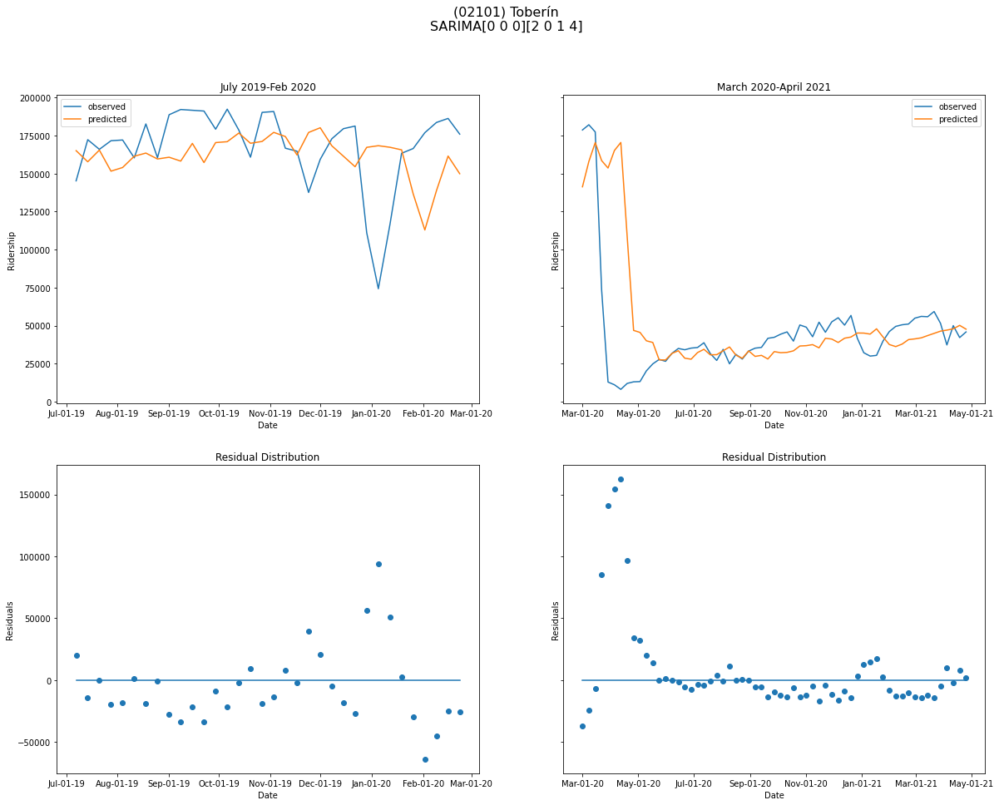

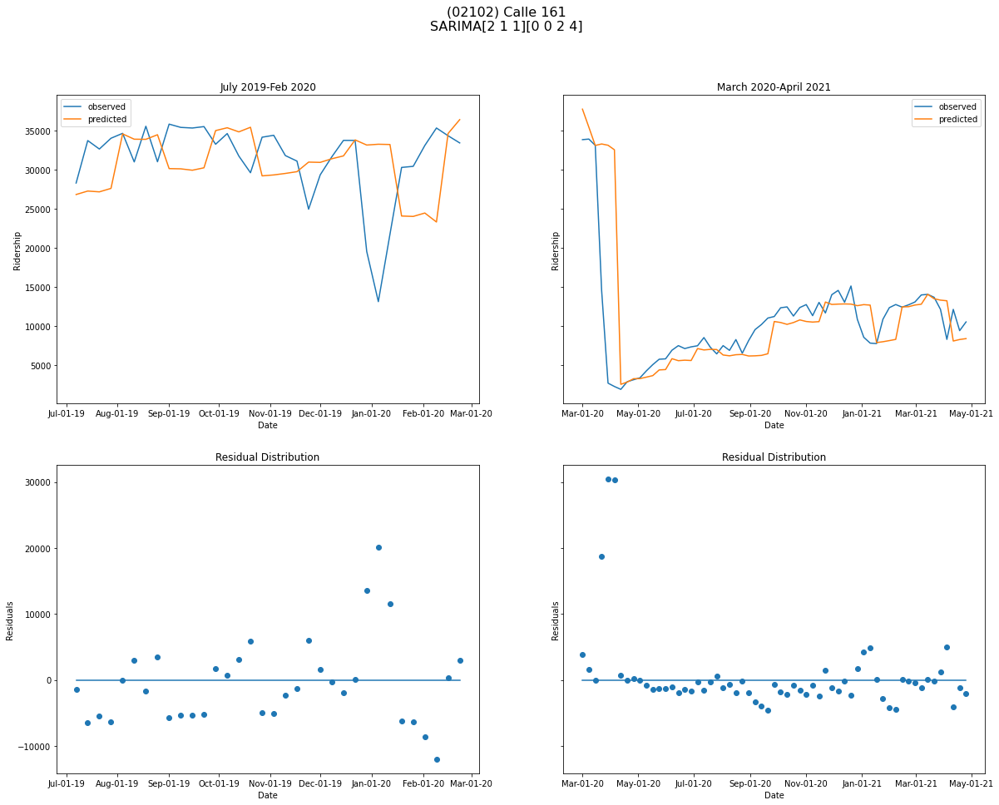

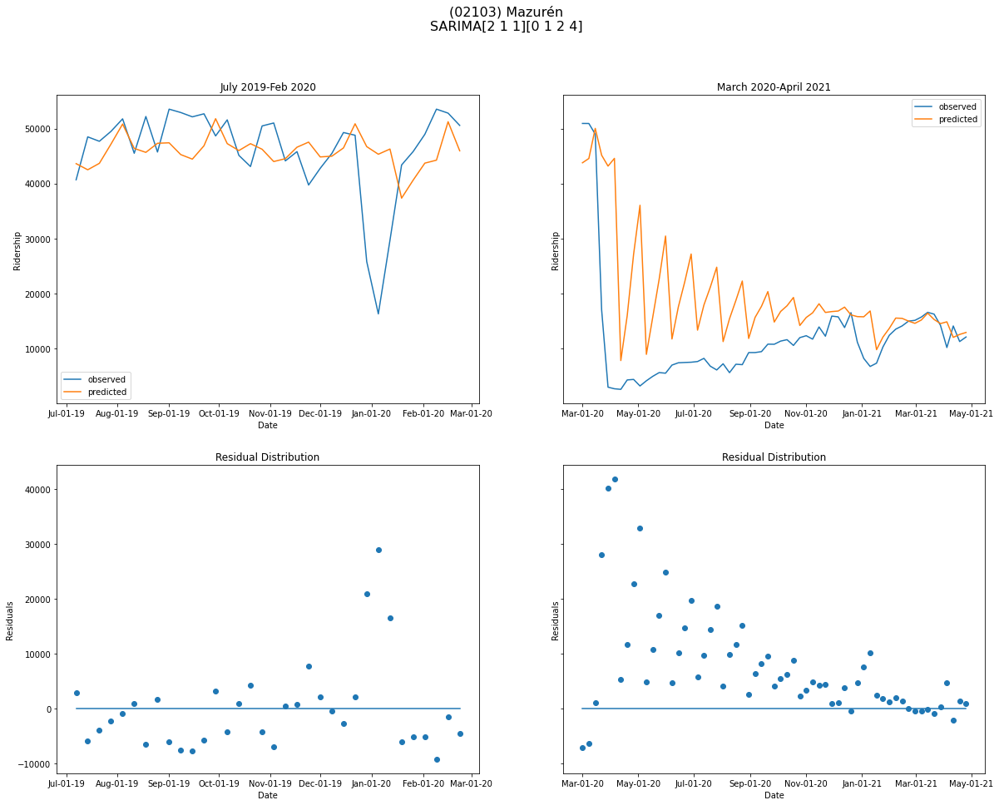

...

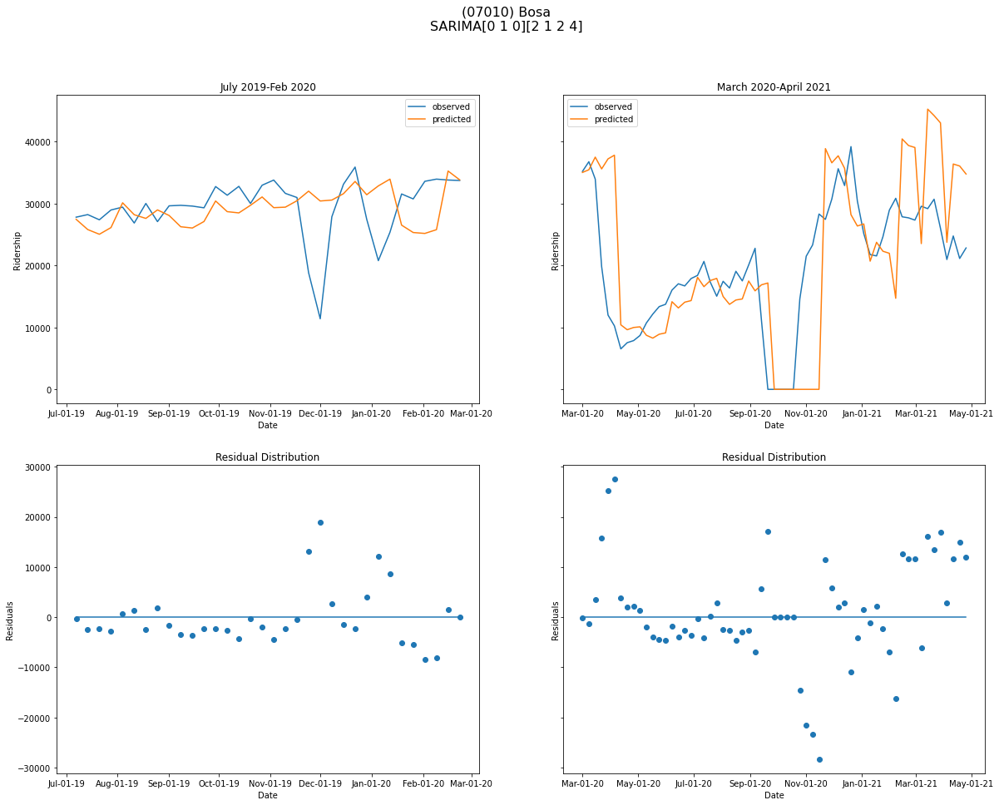

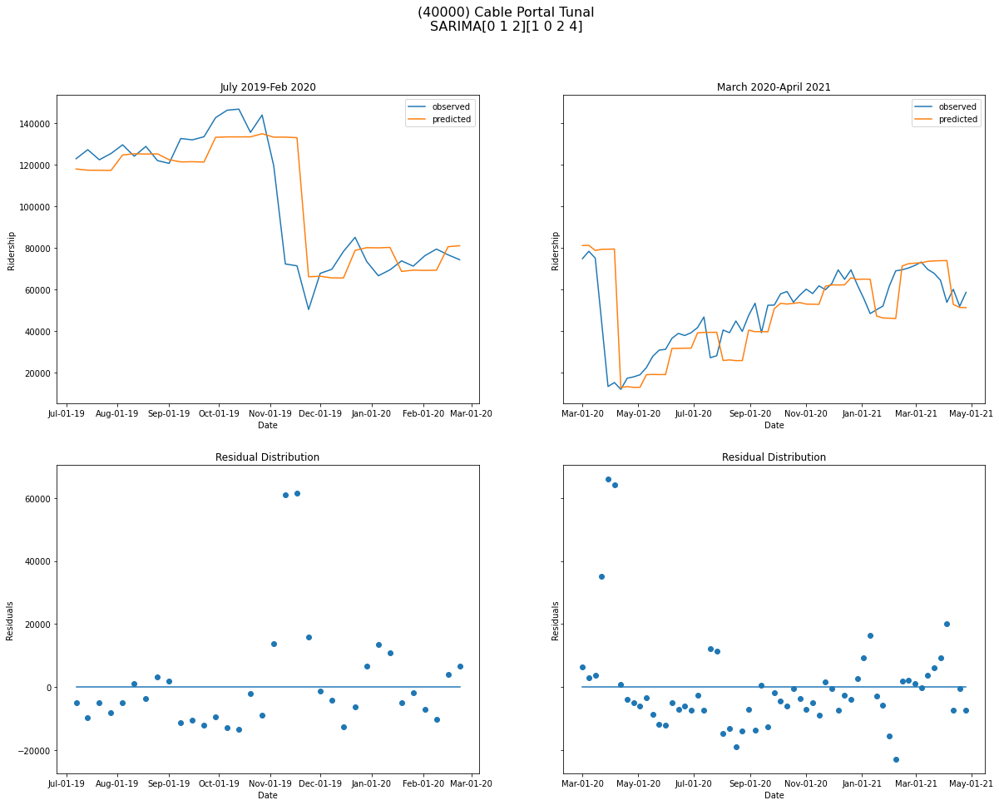

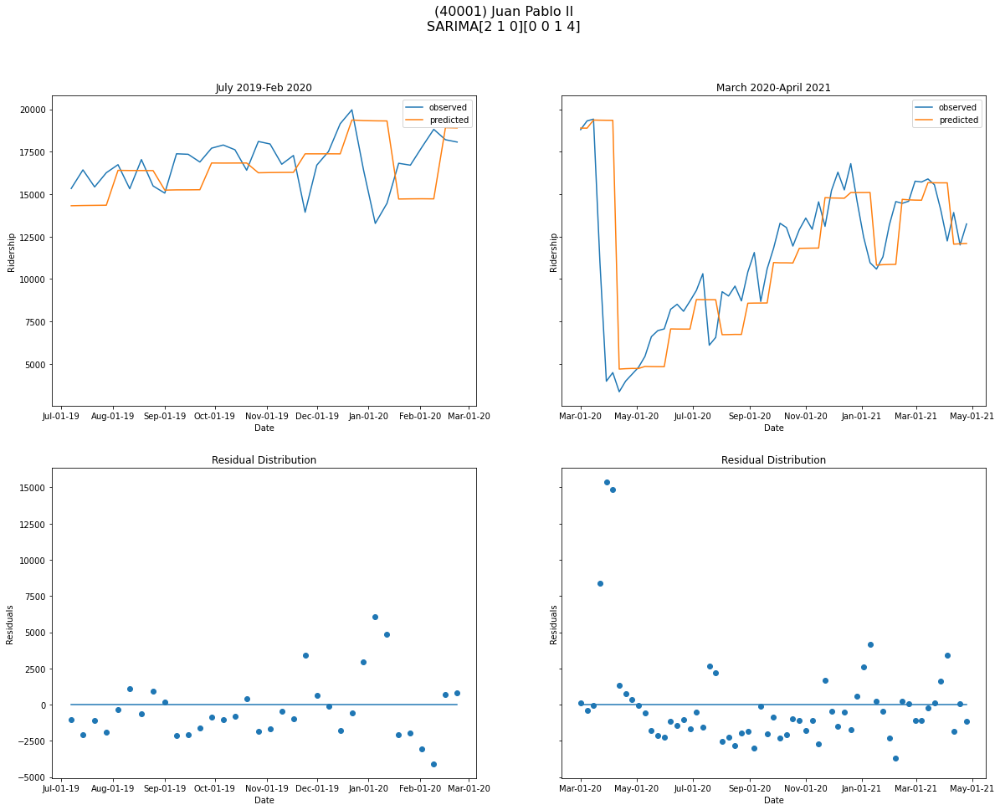

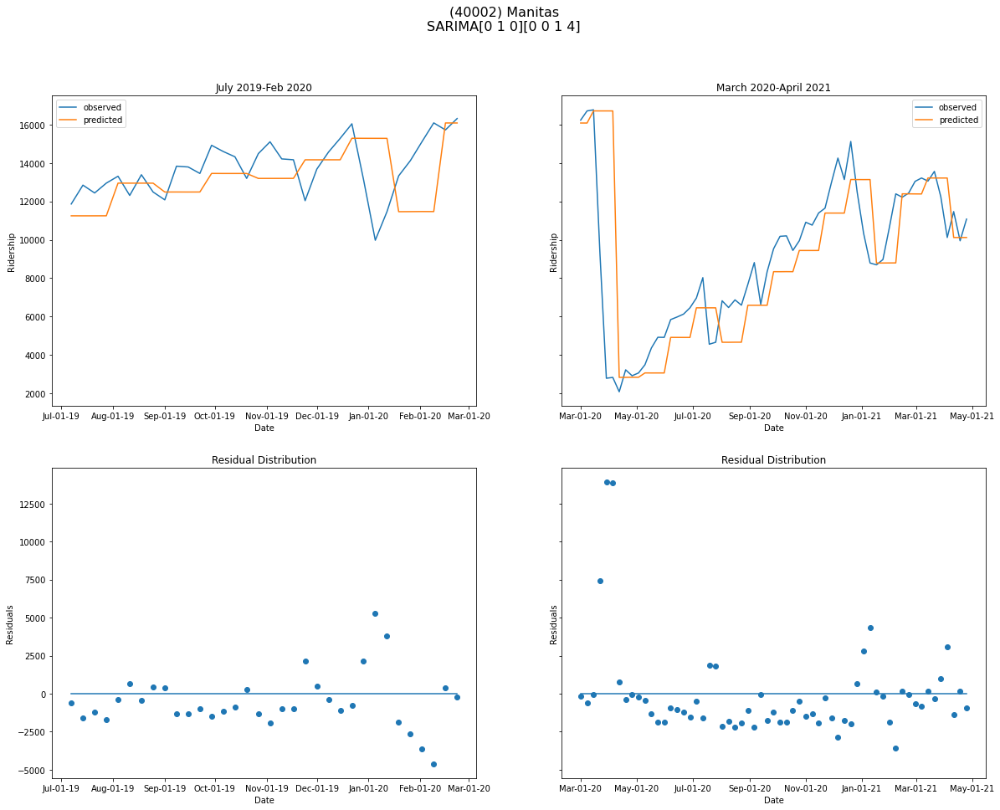

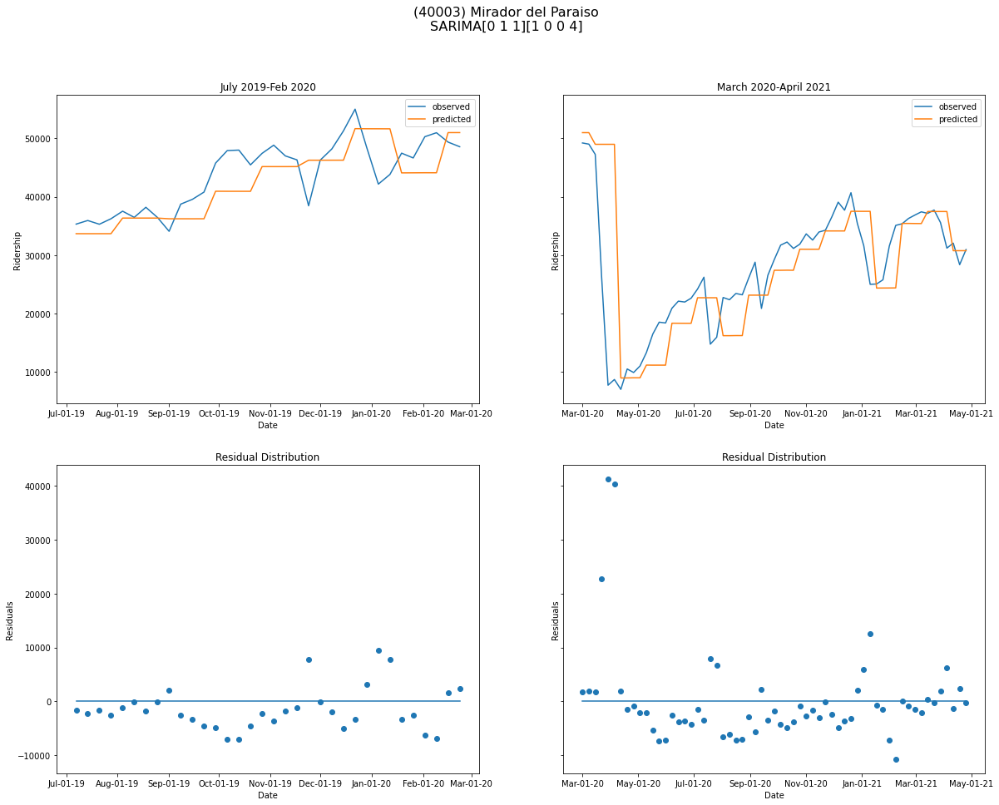

In [36]:
%%time

station_names = cleaned_data.columns
results_intermediate_weekly = {}

for i in station_names:
    print(i)
    try:
        result = intermediateSARIMA_results(cleaned_data[[i]], sarima_hp_weekly, agg_type='weekly', log_transform=True)
    except:
        continue
    results_intermediate_weekly[i] = result

In [77]:
MAPE_test = []
VAPE_test = []
RMSE_test = []

MAPE_covid = []
VAPE_covid = []
RMSE_covid = []

for i in station_names:
    test_results = np.exp(results_intermediate_weekly[i]['predicted values (test)'])
    covid_results = np.exp(results_intermediate_weekly[i]['predicted values (COVID)'])
    
    MAPE_test.append(MAPE(test_results))
    VAPE_test.append(VAPE(test_results))
    RMSE_test.append(RMSE(test_results))
    
    MAPE_covid.append(MAPE(covid_results))
    VAPE_covid.append(VAPE(covid_results))
    RMSE_covid.append(RMSE(covid_results))

In [78]:
MAPE_weekly = pd.DataFrame({'station': station_names, 'test': MAPE_test, 'covid': MAPE_covid})
VAPE_weekly = pd.DataFrame({'station': station_names, 'test': VAPE_test, 'covid': VAPE_covid})
RMSE_weekly = pd.DataFrame({'station': station_names, 'test': RMSE_test, 'covid': RMSE_covid})

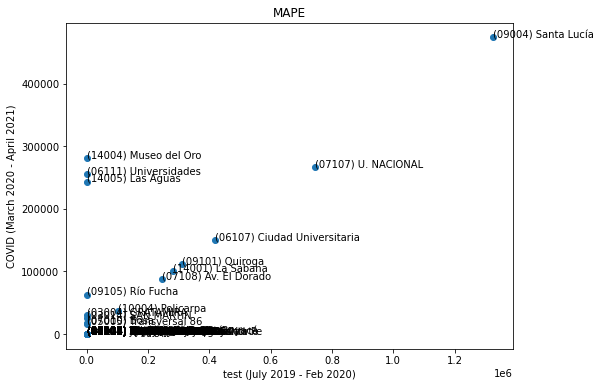

In [148]:
to_plot1 = MAPE_weekly
#to_plot1 = MAPE_weekly[MAPE_weekly['station'] != '(09004) Santa Lucía']
#to_plot1 = MAPE_weekly[MAPE_weekly['test'] < 10].reset_index()

fig,ax = plt.subplots(figsize=(8,6))
plt.scatter(to_plot1['test'], to_plot1['covid'])
plt.xlabel('test (July 2019 - Feb 2020)')
plt.ylabel('COVID (March 2020 - April 2021)')
plt.title('MAPE')

for i, label in enumerate(list(to_plot1['station'])):
    plt.annotate(label, (to_plot1['test'][i], to_plot1['covid'][i]))

plt.show()

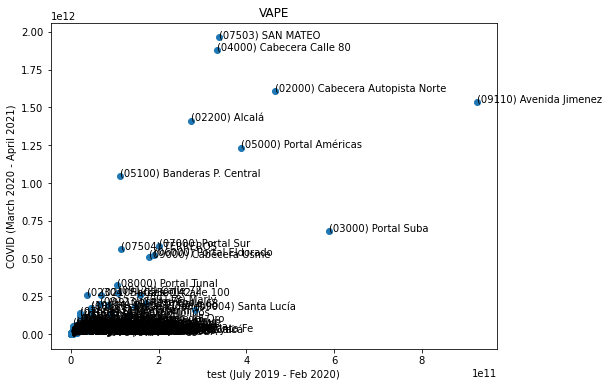

In [144]:
to_plot2 = VAPE_weekly
#to_plot2 = VAPE_weekly[VAPE_weekly['test'] < 0.4*10**10].reset_index()

fig,ax = plt.subplots(figsize=(8,6))
plt.scatter(to_plot2['test'], to_plot2['covid'])
plt.xlabel('test (July 2019 - Feb 2020)')
plt.ylabel('COVID (March 2020 - April 2021)')
plt.title('VAPE')

for i, label in enumerate(list(to_plot2['station'])):
    plt.annotate(label, (to_plot2['test'][i], to_plot2['covid'][i]))

plt.show()

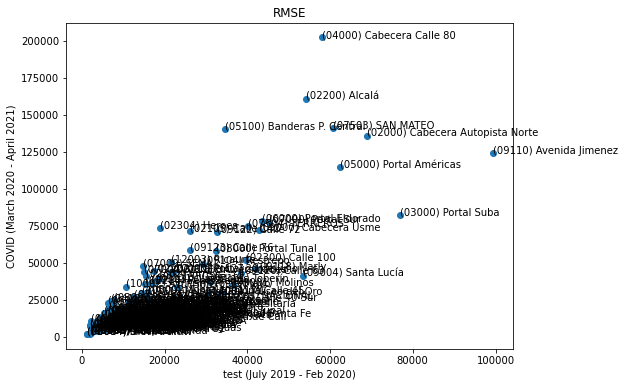

In [147]:
to_plot3 = RMSE_weekly
#to_plot3 = RMSE_weekly[RMSE_weekly['covid'] < 100000].reset_index()

fig,ax = plt.subplots(figsize=(8,6))
plt.scatter(to_plot3['test'], to_plot3['covid'])
plt.xlabel('test (July 2019 - Feb 2020)')
plt.ylabel('COVID (March 2020 - April 2021)')
plt.title('RMSE')

for i, label in enumerate(list(to_plot3['station'])):
    plt.annotate(label, (to_plot3['test'][i], to_plot3['covid'][i]))

plt.show()